# Importing Libraries and Data

In [1]:
# Importing Libraries
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from datetime import datetime as dt

In [2]:
# Importing Data
Path = r'D:\Data_Analysis\05-12-2025_Bike_Dashboard\02.Data'
df_bikes = pd.read_pickle(os.path.join(Path, 'Prepared Data', 'Bike_Trips_Clean.pkl'))
df_bikes.head()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,date,avgTemp,daily_rides,trip_duration
0,115C78C3039FFA89,electric_bike,2022-01-01 09:21:14,2022-01-01 09:35:46,Essex Light Rail,JC038,Essex Light Rail,JC038,40.712774,-74.036486,40.712774,-74.036486,member,2022-01-01,11.6,592,872.0
1,7FFD810CAA7A919E,classic_bike,2022-01-01 02:43:56,2022-01-01 02:43:57,12 St & Sinatra Dr N,HB201,12 St & Sinatra Dr N,HB201,40.750604,-74.024020,40.750604,-74.024020,member,2022-01-01,11.6,592,1.0
2,E715E8432031B72C,classic_bike,2022-01-01 02:13:33,2022-01-01 02:18:42,Essex Light Rail,JC038,Washington St,JC098,40.712774,-74.036486,40.724294,-74.035483,member,2022-01-01,11.6,592,309.0
3,BF1B7B1E1961A87B,electric_bike,2022-01-01 17:18:46,2022-01-01 18:55:25,Grand St,JC102,W 27 St & 7 Ave,6247.06,40.715178,-74.037683,40.746647,-73.993915,casual,2022-01-01,11.6,592,5799.0
4,4A01F0E53C6F4386,electric_bike,2022-01-01 11:23:32,2022-01-01 11:29:27,Christ Hospital,JC034,Hoboken Terminal - Hudson St & Hudson Pl,HB101,40.734786,-74.050444,40.735938,-74.030305,member,2022-01-01,11.6,592,355.0


# Preparing Data for Dashboard

In [3]:
# Creating a month column
df_bikes['month'] = df_bikes['date'].dt.month
df_bikes['month'] = df_bikes['month'].astype('int')
df_bikes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 895475 entries, 0 to 895474
Data columns (total 18 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   ride_id             895475 non-null  object        
 1   rideable_type       895475 non-null  object        
 2   started_at          895475 non-null  datetime64[ns]
 3   ended_at            895475 non-null  datetime64[ns]
 4   start_station_name  895475 non-null  object        
 5   start_station_id    895475 non-null  object        
 6   end_station_name    892281 non-null  object        
 7   end_station_id      892281 non-null  object        
 8   start_lat           895475 non-null  float64       
 9   start_lng           895475 non-null  float64       
 10  end_lat             893505 non-null  float64       
 11  end_lng             893505 non-null  float64       
 12  member_casual       895475 non-null  object        
 13  date                895475 no

In [4]:
# Creating a season column
df_bikes['season'] = ['winter' if (month == 12 or 1 <= month <= 4)
                     else 'spring' if (4 < month <= 5)
                     else 'summer' if (5 < month <= 9)
                     else 'fall'
                     for month in df_bikes['month']]
df_bikes.tail()

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,end_lat,end_lng,member_casual,date,avgTemp,daily_rides,trip_duration,month,season
895470,1C2DA98EA3E22C36,electric_bike,2022-12-31 11:04:03,2022-12-31 11:07:05,Southwest Park - Jackson St & Observer Hwy,HB401,City Hall - Washington St & 1 St,HB105,40.737551,-74.041664,40.737360,-74.030970,casual,2022-12-31,8.2,983,182.0,12,winter
895471,15CAD9793CBB48C2,classic_bike,2022-12-31 09:58:06,2022-12-31 10:11:04,Riverview Park,JC057,Manila & 1st,JC082,40.744703,-74.043759,40.721651,-74.042884,casual,2022-12-31,8.2,983,778.0,12,winter
895472,D48F644880B431D1,classic_bike,2022-12-31 16:35:25,2022-12-31 17:00:09,Manila & 1st,JC082,Riverview Park,JC057,40.721651,-74.042884,40.744319,-74.043991,casual,2022-12-31,8.2,983,1484.0,12,winter
895473,1E992E823B5058B7,classic_bike,2022-12-31 16:05:25,2022-12-31 16:12:24,City Hall - Washington St & 1 St,HB105,11 St & Washington St,HB502,40.737360,-74.030970,40.749985,-74.027150,casual,2022-12-31,8.2,983,419.0,12,winter
895474,055D6A3EC0CD3E03,classic_bike,2022-12-31 18:00:20,2022-12-31 18:11:33,11 St & Washington St,HB502,City Hall - Washington St & 1 St,HB105,40.749985,-74.027150,40.737360,-74.030970,member,2022-12-31,8.2,983,673.0,12,winter


In [5]:
# Creating days of the week columns
df_bikes['day_name'] = df_bikes['started_at'].dt.day_name()
df_bikes['time_period'] = pd.cut(df_bikes['started_at'].dt.hour, bins=[0,5,12,17,21,24], labels=['Night', 'Morning', 'Afternoon', 'Evening', 'Night'], right=False, ordered=False)
df_bikes.head(10)

,ride_id,rideable_type,started_at,ended_at,start_station_name,start_station_id,end_station_name,end_station_id,start_lat,start_lng,...,end_lng,member_casual,date,avgTemp,daily_rides,trip_duration,month,season,day_name,time_period
0,115C78C3039FFA89,electric_bike,2022-01-01 09:21:14,2022-01-01 09:35:46,Essex Light Rail,JC038,Essex Light Rail,JC038,40.712774,-74.036486,...,-74.036486,member,2022-01-01,11.6,592,872.0,1,winter,Saturday,Morning
1,7FFD810CAA7A919E,classic_bike,2022-01-01 02:43:56,2022-01-01 02:43:57,12 St & Sinatra Dr N,HB201,12 St & Sinatra Dr N,HB201,40.750604,-74.024020,...,-74.024020,member,2022-01-01,11.6,592,1.0,1,winter,Saturday,Night
2,E715E8432031B72C,classic_bike,2022-01-01 02:13:33,2022-01-01 02:18:42,Essex Light Rail,JC038,Washington St,JC098,40.712774,-74.036486,...,-74.035483,member,2022-01-01,11.6,592,309.0,1,winter,Saturday,Night
3,BF1B7B1E1961A87B,electric_bike,2022-01-01 17:18:46,2022-01-01 18:55:25,Grand St,JC102,W 27 St & 7 Ave,6247.06,40.715178,-74.037683,...,-73.993915,casual,2022-01-01,11.6,592,5799.0,1,winter,Saturday,Evening
4,4A01F0E53C6F4386,electric_bike,2022-01-01 11:23:32,2022-01-01 11:29:27,Christ Hospital,JC034,Hoboken Terminal - Hudson St & Hudson Pl,HB101,40.734786,-74.050444,...,-74.030305,member,2022-01-01,11.6,592,355.0,1,winter,Saturday,Morning
5,13C256ED54892996,classic_bike,2022-01-01 02:44:21,2022-01-01 02:49:51,12 St & Sinatra Dr N,HB201,Hoboken Terminal - River St & Hudson Pl,HB102,40.750604,-74.024020,...,-74.029127,member,2022-01-01,11.6,592,330.0,1,winter,Saturday,Night
6,164AC1EDDC26C06C,electric_bike,2022-01-01 01:25:10,2022-01-01 01:32:04,12 St & Sinatra Dr N,HB201,Hoboken Terminal - River St & Hudson Pl,HB102,40.750604,-74.024020,...,-74.029127,casual,2022-01-01,11.6,592,414.0,1,winter,Saturday,Night
7,991B41B69E86FBAA,classic_bike,2022-01-01 01:26:23,2022-01-01 01:31:32,Willow Ave & 12 St,HB505,Willow Ave & 12 St,HB505,40.751867,-74.030377,...,-74.030377,member,2022-01-01,11.6,592,309.0,1,winter,Saturday,Night
8,FB997C42FD9086C3,electric_bike,2022-01-01 13:53:05,2022-01-01 14:08:47,Bergen Ave & Stegman St,JC108,Bergen Ave & Stegman St,JC108,40.706575,-74.086701,...,-74.086701,casual,2022-01-01,11.6,592,942.0,1,winter,Saturday,Afternoon
9,4951439081EE64AB,electric_bike,2022-01-01 17:07:13,2022-01-01 17:22:58,Pershing Field,JC024,9 St HBLR - Jackson St & 8 St,HB305,40.742677,-74.051789,...,-74.038412,casual,2022-01-01,11.6,592,945.0,1,winter,Saturday,Evening


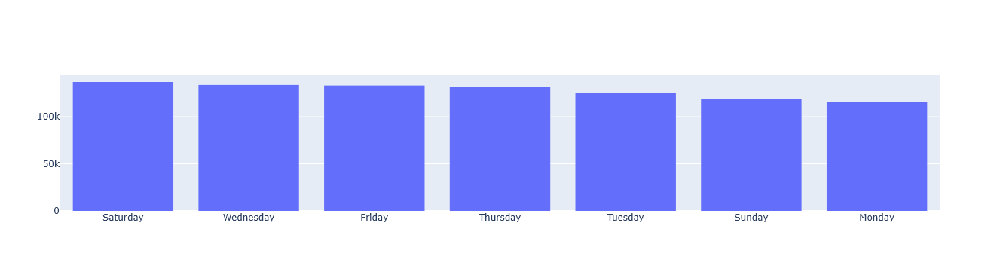

In [6]:
histday = go.Figure(data=[go.Histogram(histfunc='count', x=df_bikes['day_name'], name='count')]).update_xaxes(categoryorder='total descending')
histday.show()

In [ ]:
dayProb = df_bikes.groupby(['day_name', 'time_period'], observed=False)['member_casual'].apply(lambda x: (x=='member').mean()).reset_index(name='P(MemberperDay)')
day_prob = go.Figure(data=go.Heatmap(z=dayProb['P(MemberperDay)'], x=dayProb['day_name'], y=dayProb['time_period'], hoverongaps=False, texttemplate='%{z}', textfont={'size':10}))
day_prob.show()

In [ ]:
# memberSProb = df_bikes.groupby('season')['member_casual'].apply(lambda x: (x=='member').mean()).reset_index(name='P(MemberperSeason)')
memberProb = df_bikes.groupby('day_name')['member_casual'].apply(lambda x: (x=='member').mean()).reset_index(name='P(MemberperDay)')
member_prob = go.Figure(go.Bar(x=memberProb['day_name'], y=memberProb['P(MemberperDay)'], marker={'color':memberProb['P(MemberperDay)'], 'colorscale':'Blues'}))
member_prob.update_layout(title=dict(text='Member Probability of Riding per Day', x=0.5, font=dict(size=18, color='navy', family='bree, sans-serif')),
                 xaxis_title = 'Day of the Week',
                 xaxis = dict(color='navy', categoryorder='total ascending', title=dict(font=dict(size=14))),
                 yaxis_title = 'Member Probability of Riding',
                 yaxis = dict(gridcolor='rgba(0,0,0,0.1)', zerolinecolor='rgba(0,0,0,0.1)', color='navy', title=dict(font=dict(size=14))),
                 plot_bgcolor='lightsteelblue',
                 paper_bgcolor='white',
                 width = 900, height=600)
member_prob.show()

In [ ]:
# Using Graph Objects to plot Trip Duration line chart
durline = df_bikes.groupby('day_name')['trip_duration'].mean().reset_index(name='trip_duration')
duration_line = go.Figure(data=go.Scatter(x=durline['day_name'], y=durline['trip_duration'], name='Trip Duration', marker={'color':durline['day_name'], 'color':'navy'}))

# Find the max and round up to nearest minute mark
end_point = (max(df_bikes['trip_duration'])//60 + 1) * 60
tick_loc = np.arange(0, end_point + 1, 180)
tick_labels = [f'{int(s // 60):02d}:{int(s % 60):02d}' for s in tick_loc]

# Updating layout and Axes
duration_line.update_layout(title=dict(text='CitiBike Trip Duration per Day of the Week', x=0.5, font=dict(size=18, color='navy', family='bree, sans-serif')),
                 yaxis_title = 'Duration (Minutes)',
                 yaxis = dict(tickmode='array', tickvals=tick_loc, ticktext=tick_labels, range=[0, 1500], title=dict(font=dict(size=14))),
                 plot_bgcolor='lightsteelblue',
                 paper_bgcolor='white',
                 width=1800, height=800)
duration_line.show()

# Visualizations

In [ ]:
user_box = go.Figure()

for ride_type in df_bikes['rideable_type'].unique():
    user_box.add_trace(go.Box(x=df_bikes[df_bikes['rideable_type'] == ride_type]['member_casual'], y=df_bikes[df_bikes['rideable_type'] == ride_type]['avgTemp'], name=ride_type, boxmean=True))

user_box.update_layout(title=dict(text='Average Temperature per User Type', x=0.15, font=dict(size=18, color='navy', family='bree, sans-serif')),
                             legend=dict(yanchor='auto', y=0.4, xanchor='auto', x=0.26, bgcolor='rgba(255,255,255,0.5)'),
                             plot_bgcolor='lightsteelblue',
                             paper_bgcolor='white',
                             boxmode='group',
                             width=500, height=600)
user_box.update_xaxes(title_text='Type of Bike User', color='navy', title=dict(font=dict(size=16)))
user_box.update_yaxes(title_text='Daily Average Temperature', color='violet', title=dict(font=dict(size=16)))
user_box.show()

In [ ]:
user_box = go.Figure()

for ride_type in df_bikes['rideable_type'].unique():
    user_box.add_trace(go.Box(x=df_bikes[df_bikes['rideable_type'] == ride_type]['member_casual'], y=df_bikes[df_bikes['rideable_type'] == ride_type]['daily_rides'], name=ride_type, boxmean=True))

user_box.update_layout(title=dict(text='Trip Duration per User Type', x=0.15, font=dict(size=18, color='navy', family='bree, sans-serif')),
                             legend=dict(yanchor='auto', y=0.3, xanchor='auto', x=0.26, bgcolor='rgba(255,255,255,0.5)'),
                             plot_bgcolor='lightsteelblue',
                             paper_bgcolor='white',
                             boxmode='group',
                             width=500, height=600)
user_box.update_xaxes(title_text='Type of User', color='navy', title=dict(font=dict(size=16)))
user_box.update_yaxes(title_text='Trip Duration', color='violet', title=dict(font=dict(size=16)))
user_box.show()

## Top 20 Start Stations Bar Plot

In [ ]:
# Selecting the top 20 start stations per value counts
topStart = df_bikes['start_station_name'].value_counts().head(20)

# Creating Plotly bar chart
fig_top20 = go.Figure(go.Bar(y=topStart.index, x=topStart.values, orientation='h', marker={'color':topStart.values, 'colorscale':'Blues'}))
fig_top20.update_layout(title=dict(text='Most Popular CitiBike Stations in New York', x=0.5, font=dict(size=18, color='navy', family='bree, sans-serif')),
                 yaxis_title = 'Start Stations',
                 yaxis = dict(color='navy', categoryorder='total ascending', title=dict(font=dict(size=14))),
                 xaxis_title = 'Sum of Trips',
                 xaxis = dict(gridcolor='rgba(0,0,0,0.1)', zerolinecolor='rgba(0,0,0,0.1)', color='navy', title=dict(font=dict(size=14))),
                 plot_bgcolor='lightsteelblue',
                 paper_bgcolor='white',
                 width = 900, height=600)
fig_top20.show()

# Calculating trip percentage of total 20 station trips captured by the top 5 stations.
Top4_proportion = (df_bikes['start_station_name'].value_counts().head(4).sum()) / \
    (df_bikes['start_station_name'].value_counts().head(20).sum())
print(f'\033[1mThe Top 4 stations account for {Top4_proportion:.2%} of the top 20 station trips.\033[0m')

## Daily Rides and Average Temperature Dual Axis Line Plot

In [ ]:
# Using Graph Objects to plot dual axis line chart
fig_DAline = make_subplots(specs = [[{'secondary_y':True}]])
fig_DAline.add_trace(go.Scatter(x=df_bikes['date'], y=df_bikes['daily_rides'], name='Daily Rides', marker={'color':df_bikes['daily_rides'], 'color':'navy'}),
               secondary_y=False)
fig_DAline.add_trace(go.Scatter(x=df_bikes['date'], y=df_bikes['avgTemp'], name='Daily Average Temperatures', marker={'color':df_bikes['avgTemp'], 'color':'violet'}),
               secondary_y=True)

# Updating layout and Axes
fig_DAline.update_layout(title=dict(text='CitiBike Daily Rides and Average Temperature (2022)', x=0.5, font=dict(size=18, color='navy', family='bree, sans-serif')),
                 plot_bgcolor='lightsteelblue',
                 paper_bgcolor='white',
                 width=1800, height=800)
fig_DAline.update_yaxes(title_text='Sum of Daily Rides', secondary_y=False, color='navy', title=dict(font=dict(size=14)))
fig_DAline.update_yaxes(title_text='Daily Average Temperature', secondary_y=True, color='violet', title=dict(font=dict(size=14)))
fig_DAline.show()

# Calculating Pearson's correlation coefficient
correlation = df_bikes['daily_rides'].corr(df_bikes['avgTemp'])
print(f'Daily Rides and Daily Average Temperature have a {"Strong Positive" if correlation > 0.7 else "Moderate Positive" if correlation > 0.4 else "Weak"} Correlation: {correlation:.3f}')

# Reducing size of Top 20 Station and Bikes DataFrame

In [14]:
# Changing data type of 20 Stations DataFrame
topStart = pd.DataFrame(topStart).reset_index()
topStart.rename(columns={'start_station_name':'start_station', 'count':'total_trips'}, inplace=True)
topStart['total_trips'] = topStart['total_trips'].astype('uint16')
topStart.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20 entries, 0 to 19
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   start_station  20 non-null     object
 1   total_trips    20 non-null     uint16
dtypes: object(1), uint16(1)
memory usage: 328.0+ bytes


In [15]:
# Keeping only essential columns of df_bikes data frame
bikes_red = df_bikes[['start_station_name', 'end_station_name', 'member_casual', 'avgTemp', 'season', 'date', 'day_name', 'time_period', 'rideable_type', 'daily_rides', 'trip_duration']].copy()
bikes_red['daily_rides'] = bikes_red['daily_rides'].astype('int16')
bikes_red.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 895475 entries, 0 to 895474
Data columns (total 11 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   start_station_name  895475 non-null  object        
 1   end_station_name    892281 non-null  object        
 2   member_casual       895475 non-null  object        
 3   avgTemp             895475 non-null  float64       
 4   season              895475 non-null  object        
 5   date                895475 non-null  datetime64[ns]
 6   day_name            895475 non-null  object        
 7   time_period         895475 non-null  category      
 8   rideable_type       895475 non-null  object        
 9   daily_rides         895475 non-null  int16         
 10  trip_duration       895475 non-null  float64       
dtypes: category(1), datetime64[ns](1), float64(2), int16(1), object(6)
memory usage: 64.0+ MB


In [16]:
# Creating a Random Split of Bikes Reduced DataFrame
np.random.seed(42)
red = np.random.rand(len(bikes_red)) <= 0.92
small = bikes_red[~red]
small.tail()

,start_station_name,end_station_name,member_casual,avgTemp,season,date,day_name,time_period,rideable_type,daily_rides,trip_duration
895430,Adams St & 2 St,Bloomfield St & 15 St,member,8.2,winter,2022-12-31,Saturday,Evening,classic_bike,983,410.0
895439,City Hall - Washington St & 1 St,Clinton St & 7 St,member,8.2,winter,2022-12-31,Saturday,Afternoon,classic_bike,983,225.0
895443,City Hall - Washington St & 1 St,Clinton St & 7 St,casual,8.2,winter,2022-12-31,Saturday,Morning,classic_bike,983,1425.0
895453,4 St & Grand St,11 St & Washington St,casual,8.2,winter,2022-12-31,Saturday,Evening,classic_bike,983,219.0
895459,City Hall - Washington St & 1 St,11 St & Washington St,member,8.2,winter,2022-12-31,Saturday,Evening,classic_bike,983,670.0


In [17]:
# Reviewing statistics to confirm data integrity
small.describe()

,avgTemp,date,daily_rides,trip_duration
count,71811.000000,71811,71811.000000,71811.000000
mean,17.525364,2022-07-21 19:27:50.735680768,2947.094860,1046.337971
min,-11.700000,2022-01-01 00:00:00,111.000000,-3331.000000
25%,11.600000,2022-05-22 00:00:00,2214.000000,271.000000
50%,19.200000,2022-07-27 00:00:00,3188.000000,431.000000
75%,24.300000,2022-09-27 00:00:00,3686.000000,737.000000
max,31.300000,2022-12-31 00:00:00,4527.000000,787327.000000
std,8.476559,NaN,937.039412,6869.422085


# Exporting Reduced Data

In [19]:
topStart.to_csv(os.path.join(Path, 'Prepared Data', 'Top_Start.csv'), index=False)
small.to_csv(os.path.join(Path, 'Prepared Data', 'Reduced_Trips.csv'), index=False)